In [3]:
!pip install textblob
!pip install gensim
!pip install pyLDAvis --user
!pip install tqdm

In [4]:
#To remove the Depreciation warnings
#!pip install install ipython==7.10.0

In [2]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', 50)
import nltk
nltk.download('punkt')
import re
nltk.download('stopwords')
nltk.download('wordnet')
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
from nltk.stem.snowball import SnowballStemmer
from nltk.stem import WordNetLemmatizer  
le=WordNetLemmatizer()

from nltk.tokenize import TweetTokenizer
tt = TweetTokenizer()

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

#from tqdm import tqdm
#tqdm.pandas(desc="my bar!")

#from tqdm import tqdm, tqdm_notebook
#tqdm.pandas(tqdm_notebook)

#from tqdm.auto import tqdm
#tqdm.pandas()


from textblob import TextBlob
import scipy.stats as stats
from collections import Counter
from sklearn.manifold import TSNE
from wordcloud import WordCloud

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\balam\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\balam\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\balam\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [3]:
from sklearn.metrics.pairwise import cosine_similarity
import networkx as nx

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation as LDA
from sklearn.model_selection import GridSearchCV

import gensim
from gensim import models, corpora
from gensim.models import LsiModel
from gensim import similarities

from sklearn.decomposition import NMF, LatentDirichletAllocation, TruncatedSVD
from sklearn.metrics.pairwise import euclidean_distances

from gensim.models.coherencemodel import CoherenceModel
from gensim.corpora.dictionary import Dictionary
from gensim.models.nmf import Nmf
from collections import Counter
from operator import itemgetter

In [4]:
import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()
import matplotlib.pyplot as plt
import seaborn as sns

In [5]:
## Display all rows and columns of a dataframe instead of a truncated version
from IPython.display import display
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [6]:
df = pd.read_csv("C:/Users/balam/OneDrive/Documents/PallaviC820/Data/covid19_tweets.csv", encoding = "utf-8")
df.info()
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 179108 entries, 0 to 179107
Data columns (total 13 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   user_name         179108 non-null  object
 1   user_location     142337 non-null  object
 2   user_description  168822 non-null  object
 3   user_created      179108 non-null  object
 4   user_followers    179108 non-null  int64 
 5   user_friends      179108 non-null  int64 
 6   user_favourites   179108 non-null  int64 
 7   user_verified     179108 non-null  bool  
 8   date              179108 non-null  object
 9   text              179108 non-null  object
 10  hashtags          127774 non-null  object
 11  source            179031 non-null  object
 12  is_retweet        179108 non-null  bool  
dtypes: bool(2), int64(3), object(8)
memory usage: 15.4+ MB


,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,['COVID19'],Twitter for iPhone,False
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False


In [10]:
# Removal of Special Characters
#df['text'] = df['text'].map(str).apply(lambda x: x.encode('utf-8').decode('ascii', 'ignore'))
#df.head(10)

In [7]:
contractions = {
"ain't": "am not / are not",
"aren't": "are not / am not",
"can't": "cannot",
"can't've": "cannot have",
"'cause": "because",
"could've": "could have",
"couldn't": "could not",
"couldn't've": "could not have",
"didn't": "did not",
"doesn't": "does not",
"don't": "do not",
"hadn't": "had not",
"hadn't've": "had not have",
"hasn't": "has not",
"haven't": "have not",
"he'd": "he had / he would",
"he'd've": "he would have",
"he'll": "he shall / he will",
"he'll've": "he shall have / he will have",
"he's": "he has / he is",
"how'd": "how did",
"how'd'y": "how do you",
"how'll": "how will",
"how's": "how has / how is",
"i'd": "I had / I would",
"i'd've": "I would have",
"i'll": "I shall / I will",
"i'll've": "I shall have / I will have",
"i'm": "I am",
"i've": "I have",
"isn't": "is not",
"it'd": "it had / it would",
"it'd've": "it would have",
"it'll": "it shall / it will",
"it'll've": "it shall have / it will have",
"it's": "it has / it is",
"let's": "let us",
"ma'am": "madam",
"mayn't": "may not",
"might've": "might have",
"mightn't": "might not",
"mightn't've": "might not have",
"must've": "must have",
"mustn't": "must not",
"mustn't've": "must not have",
"needn't": "need not",
"needn't've": "need not have",
"o'clock": "of the clock",
"oughtn't": "ought not",
"oughtn't've": "ought not have",
"shan't": "shall not",
"sha'n't": "shall not",
"shan't've": "shall not have",
"she'd": "she had / she would",
"she'd've": "she would have",
"she'll": "she shall / she will",
"she'll've": "she shall have / she will have",
"she's": "she has / she is",
"should've": "should have",
"shouldn't": "should not",
"shouldn't've": "should not have",
"so've": "so have",
"so's": "so as / so is",
"that'd": "that would / that had",
"that'd've": "that would have",
"that's": "that has / that is",
"there'd": "there had / there would",
"there'd've": "there would have",
"there's": "there has / there is",
"they'd": "they had / they would",
"they'd've": "they would have",
"they'll": "they shall / they will",
"they'll've": "they shall have / they will have",
"they're": "they are",
"they've": "they have",
"to've": "to have",
"wasn't": "was not",
"we'd": "we had / we would",
"we'd've": "we would have",
"we'll": "we will",
"we'll've": "we will have",
"we're": "we are",
"we've": "we have",
"weren't": "were not",
"what'll": "what shall / what will",
"what'll've": "what shall have / what will have",
"what're": "what are",
"what's": "what has / what is",
"what've": "what have",
"when's": "when has / when is",
"when've": "when have",
"where'd": "where did",
"where's": "where has / where is",
"where've": "where have",
"who'll": "who shall / who will",
"who'll've": "who shall have / who will have",
"who's": "who has / who is",
"who've": "who have",
"why's": "why has / why is",
"why've": "why have",
"will've": "will have",
"won't": "will not",
"won't've": "will not have",
"would've": "would have",
"wouldn't": "would not",
"wouldn't've": "would not have",
"y'all": "you all",
"y'all'd": "you all would",
"y'all'd've": "you all would have",
"y'all're": "you all are",
"y'all've": "you all have",
"you'd": "you had / you would",
"you'd've": "you would have",
"you'll": "you shall / you will",
"you'll've": "you shall have / you will have",
"you're": "you are",
"you've": "you have"
}

In [8]:
def clean_documents(text):
    
    if pd.isnull(text):
        return text
    
    text = text.lower()
    for word in text.split():
        if word.lower() in contractions:
            text = text.replace(word, contractions[word.lower()])
#    text = re.sub(r':.*$', ":", text) #remove URLs
#    text = re.sub(r"http\S+", "", text)     
    text = re.sub('http[^\s]+','',text) #Remove URLs
    text = re.sub("@[A-Za-z0-9_]+","", text) #Remove @mentions
    text = re.sub("#[A-Za-z0-9_]+","", text) #Remove hashtags
    text = re.sub(r'\[.*?\]', '', text) #Remove text in square brackets
    text = re.sub("[^a-zA-Z#]", ' ', text) #Remove special characters
    word_tokens  = tt.tokenize(text)
    tokens       = [le.lemmatize(w) for w in word_tokens if w not in stop_words and len(w)>3]
    cleaned_text =" ".join(tokens)
    
    return cleaned_text

<>:12: DeprecationWarning: invalid escape sequence \s
<>:12: DeprecationWarning: invalid escape sequence \s
<ipython-input-8-a2ca9b492a45>:12: DeprecationWarning: invalid escape sequence \s
  text = re.sub('http[^\s]+','',text) #Remove URLs


In [10]:
pd.options.display.max_colwidth = 150
df['text'].head(10)

0    If I smelled the scent of hand sanitizers today on someone in the past, I would think they were so intoxicated that… https://t.co/QZvYbrOgb0
1    Hey @Yankees @YankeesPR and @MLB - wouldn't it have made more sense to have the players pay their respects to the A… https://t.co/1QvW0zgyPu
2    @diane3443 @wdunlap @realDonaldTrump Trump never once claimed #COVID19 was a hoax. We all claim that this effort to… https://t.co/Jkk8vHWHb3
3     @brookbanktv The one gift #COVID19 has give me is an appreciation for the simple things that were always around me… https://t.co/Z0pOAlFXcW
4     25 July : Media Bulletin on Novel #CoronaVirusUpdates #COVID19 \n@kansalrohit69 @DrSyedSehrish @airnewsalerts @ANI… https://t.co/MN0EEcsJHh
5    #coronavirus #covid19 deaths continue to rise. It's almost  as bad as it ever was.  Politicians and businesses want… https://t.co/hXMHooXX2C
6              How #COVID19 Will Change Work in General (and recruiting, specifically) via/ @ProactiveTalent #Recruiting… ht

In [12]:

df['clean_text'] = df['text'].apply(lambda x: clean_documents(x))
df['clean_text'].head(10)

0    smelled scent hand sanitizers today someone past would think intoxicated
1                                             would made sense player respect
2                                       trump never claimed hoax claim effort
3                           gift give appreciation simple thing always around
4                                                  july medium bulletin novel
5                    death continue rise almost ever politician business want
6                                 change work general recruiting specifically
7         wear face covering shopping includes visit local community pharmacy
8                                                praying good health recovery
9                                    pope prophet sadhu sundar selvaraj watch
Name: clean_text, dtype: object

In [16]:
#df.head(50)
df.to_csv("C:/Users/balam/OneDrive/Documents/PallaviC820/Data/cleanedtweets02.csv")

In [17]:
# Define helper functions
def get_top_n_words(n_top_words, count_vectorizer, text_data):
    '''
    returns a tuple of the top n words in a sample and their 
    accompanying counts, given a CountVectorizer object and text sample
    '''
    vectorized_tweets = count_vectorizer.fit_transform(text_data.values)
    vectorized_total = np.sum(vectorized_tweets, axis=0)
    word_indices = np.flip(np.argsort(vectorized_total)[0,:], 1)
    word_values = np.flip(np.sort(vectorized_total)[0,:],1)
    
    word_vectors = np.zeros((n_top_words, vectorized_tweets.shape[1]))
    for i in range(n_top_words):
        word_vectors[i,word_indices[0,i]] = 1

    words = [word[0].encode('ascii').decode('utf-8') for 
             word in count_vectorizer.inverse_transform(word_vectors)]

    return (words, word_values[0,:n_top_words].tolist()[0])

In [18]:
# Define helper functions
def get_keys(topic_matrix):
    '''
    returns an integer list of predicted topic 
    categories for a given topic matrix
    '''
    keys = topic_matrix.argmax(axis=1).tolist()
    return keys

def keys_to_counts(keys):
    '''
    returns a tuple of topic categories and their 
    accompanying magnitudes for a given list of keys
    '''
    count_pairs = Counter(keys).items()
    categories = [pair[0] for pair in count_pairs]
    counts = [pair[1] for pair in count_pairs]
    return (categories, counts)

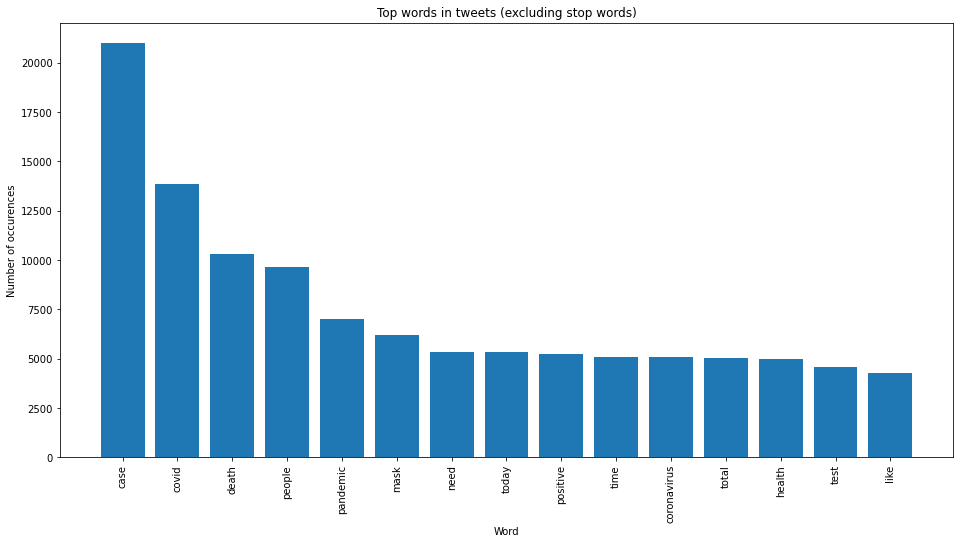

In [19]:
count_vectorizer = CountVectorizer(stop_words='english')
words, word_values = get_top_n_words(n_top_words=15,
                                     count_vectorizer=count_vectorizer, 
                                     text_data=df['clean_text'])

fig, ax = plt.subplots(figsize=(16,8))
ax.bar(range(len(words)), word_values);
ax.set_xticks(range(len(words)));
ax.set_xticklabels(words, rotation='vertical');
ax.set_title('Top words in tweets (excluding stop words)');
ax.set_xlabel('Word');
ax.set_ylabel('Number of occurences');
plt.show()

In [20]:
#LDA Topic Modelling
vectorizer = CountVectorizer(analyzer='word',       
                             min_df=10,# minimum reqd occurences of a word 
                             stop_words='english',             # remove stop words
                             lowercase=True,                   # convert all words to lowercase
                             token_pattern='[a-zA-Z0-9]{3,}')  # num chars > 3
data_vectorized = vectorizer.fit_transform(df['clean_text'])


In [21]:
# Build LDA Model
lda_model = LatentDirichletAllocation(n_components=10,           # Number of topics
                                      max_iter=2,               # Max learning iterations
                                      learning_method='online',   
                                      random_state=100,          # Random state
                                      batch_size=128,            # n docs in each learning iter
                                      evaluate_every = -1,       # compute perplexity every n iters, default: Don't
                                      n_jobs = -1,               # Use all available CPUs
                                     )
lda_output = lda_model.fit_transform(data_vectorized)
print(lda_model)  # Model attributes

LatentDirichletAllocation(learning_method='online', max_iter=2, n_jobs=-1,
                          random_state=100)


In [22]:
# Log Likelyhood: Higher the better
print("Log Likelihood: ", lda_model.score(data_vectorized))
# Perplexity: Lower the better. Perplexity = exp(-1. * log-likelihood per word)
print("Perplexity: ", lda_model.perplexity(data_vectorized))
# See model parameters
print(lda_model.get_params())


Log Likelihood:  -8851343.9908307
Perplexity:  3393.030629532053
{'batch_size': 128, 'doc_topic_prior': None, 'evaluate_every': -1, 'learning_decay': 0.7, 'learning_method': 'online', 'learning_offset': 10.0, 'max_doc_update_iter': 100, 'max_iter': 2, 'mean_change_tol': 0.001, 'n_components': 10, 'n_jobs': -1, 'perp_tol': 0.1, 'random_state': 100, 'topic_word_prior': None, 'total_samples': 1000000.0, 'verbose': 0}


In [23]:
display_data = pyLDAvis.sklearn.prepare(lda_model, #our pre-trained LDA model
                         data_vectorized, #this gives us our document-term matrix
                        vectorizer) #the vectoriser object
                        
pyLDAvis.display(display_data)  

C:\Users\balam\AppData\Roaming\Python\Python38\site-packages\pyLDAvis\_prepare.py:246: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  default_term_info = default_term_info.sort_values(


In [26]:
def topics_document(model_output, n_topics , data):
    '''
    returns a dataframe for each tweet having topic weightages
    and the dominant topic for each tweet. 
    '''
    
    # column names
    topicnames = ["Topic" + str(i) for i in range(n_topics)]
    # index names
    docnames = ["Doc" + str(i) for i in range(len(data))]
    # Make the pandas dataframe
    df_tweet_topic = pd.DataFrame(np.round(model_output, 2), columns=topicnames, index=docnames)
    # Get dominant topic for each document
    dominant_topic = np.argmax(df_tweet_topic.values, axis=1)
    df_tweet_topic["dominant_topic"] = dominant_topic
    
    return df_tweet_topic

In [54]:
#To avoid memory issues break into chunks
#n = 200000  #chunk row size
#list_df = [df[i:i+n] for i in range(0,df.shape[0],n)]
#for i in list_df:
document_topic_lda = topics_document(lda_output, n_topics=10, data=i['clean_text'])
#    document_topic_lda = pd.concat(document_topic_lda1)
document_topic_lda.head(20)


,Topic0,Topic1,Topic2,Topic3,Topic4,Topic5,Topic6,Topic7,Topic8,Topic9,dominant_topic
Doc0,0.44,0.01,0.01,0.16,0.16,0.01,0.16,0.01,0.01,0.01,0
Doc1,0.77,0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.03,0
Doc2,0.02,0.02,0.02,0.85,0.02,0.02,0.02,0.02,0.02,0.02,3
Doc3,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.02,0.22,0.62,9
Doc4,0.02,0.22,0.62,0.02,0.02,0.02,0.02,0.02,0.02,0.02,2
Doc5,0.01,0.30,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.59,9
Doc6,0.02,0.02,0.85,0.02,0.02,0.02,0.02,0.02,0.02,0.02,2
Doc7,0.01,0.01,0.01,0.01,0.01,0.01,0.11,0.01,0.01,0.81,9
Doc8,0.02,0.61,0.02,0.02,0.23,0.02,0.02,0.02,0.02,0.02,1
Doc9,0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.03,0.77,9


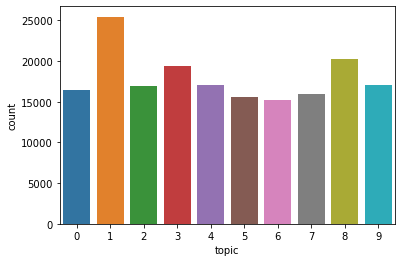

In [55]:
lda_keys = get_keys(lda_output)
lda_categories, lda_counts = keys_to_counts(lda_keys)

topics_df_lda = pd.DataFrame({'topic' : lda_categories, 'count' : lda_counts})
sns.barplot(x=topics_df_lda['topic'], y = topics_df_lda['count'])
plt.show()


In [56]:
#Concatenate the topics into the original dataframe
df['topic'] = document_topic_lda['dominant_topic'].to_numpy()


In [57]:
from nltk.stem import PorterStemmer
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.sentiment.util import *
nltk.download('stopwords')
nltk.download('vader_lexicon')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\balam\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\balam\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [58]:
sid=SentimentIntensityAnalyzer()
ps=lambda x:sid.polarity_scores(x)

#Seperate first topic
df1 = df[df['topic'] == 0]
sentiment_scores=df.clean_text.apply(ps)
sentiment_scores

0            {'neg': 0.0, 'neu': 0.738, 'pos': 0.262, 'compound': 0.4939}
1            {'neg': 0.0, 'neu': 0.563, 'pos': 0.437, 'compound': 0.4767}
2            {'neg': 0.0, 'neu': 0.734, 'pos': 0.266, 'compound': 0.2057}
3            {'neg': 0.0, 'neu': 0.446, 'pos': 0.554, 'compound': 0.7351}
4            {'neg': 0.0, 'neu': 0.566, 'pos': 0.434, 'compound': 0.3182}
5         {'neg': 0.348, 'neu': 0.536, 'pos': 0.116, 'compound': -0.5574}
6                   {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
7                   {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
8              {'neg': 0.0, 'neu': 0.27, 'pos': 0.73, 'compound': 0.6597}
9                   {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
10         {'neg': 0.215, 'neu': 0.538, 'pos': 0.247, 'compound': 0.0772}
11                  {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
12           {'neg': 0.0, 'neu': 0.086, 'pos': 0.914, 'compound': 0.8625}
13           {'neg': 0.0, 'neu': 0.506

In [59]:
sid=SentimentIntensityAnalyzer()
ps=lambda x:sid.polarity_scores(x)
sentiment_scores=df1.clean_text.apply(ps)
sentiment_scores.head(20)

0         {'neg': 0.0, 'neu': 0.738, 'pos': 0.262, 'compound': 0.4939}
1         {'neg': 0.0, 'neu': 0.563, 'pos': 0.437, 'compound': 0.4767}
27      {'neg': 0.265, 'neu': 0.513, 'pos': 0.222, 'compound': -0.128}
29         {'neg': 0.0, 'neu': 0.577, 'pos': 0.423, 'compound': 0.765}
33               {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
36     {'neg': 0.237, 'neu': 0.555, 'pos': 0.208, 'compound': -0.0534}
70      {'neg': 0.279, 'neu': 0.492, 'pos': 0.23, 'compound': -0.1531}
81       {'neg': 0.615, 'neu': 0.385, 'pos': 0.0, 'compound': -0.4939}
86       {'neg': 0.298, 'neu': 0.702, 'pos': 0.0, 'compound': -0.5267}
88       {'neg': 0.109, 'neu': 0.891, 'pos': 0.0, 'compound': -0.0258}
94               {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
95     {'neg': 0.374, 'neu': 0.447, 'pos': 0.179, 'compound': -0.5423}
97     {'neg': 0.504, 'neu': 0.315, 'pos': 0.181, 'compound': -0.6249}
109      {'neg': 0.25, 'neu': 0.427, 'pos': 0.323, 'compound': 0.0516}
110   

In [60]:
sentiment_df=pd.DataFrame(data=list(sentiment_scores))
display(sentiment_df.head())

,neg,neu,pos,compound
0,0.000,0.738,0.262,0.4939
1,0.000,0.563,0.437,0.4767
2,0.265,0.513,0.222,-0.1280
3,0.000,0.577,0.423,0.7650
4,0.000,1.000,0.000,0.0000


In [61]:
labelize=lambda x:'neutral' if x==0 else('positive' if x>0 else 'negative')
sentiment_df['label']=sentiment_df.compound.apply(labelize)
display(sentiment_df.head(10))

,neg,neu,pos,compound,label
0,0.000,0.738,0.262,0.4939,positive
1,0.000,0.563,0.437,0.4767,positive
2,0.265,0.513,0.222,-0.1280,negative
3,0.000,0.577,0.423,0.7650,positive
4,0.000,1.000,0.000,0.0000,neutral
5,0.237,0.555,0.208,-0.0534,negative
6,0.279,0.492,0.230,-0.1531,negative
7,0.615,0.385,0.000,-0.4939,negative
8,0.298,0.702,0.000,-0.5267,negative
9,0.109,0.891,0.000,-0.0258,negative


In [62]:
data=df1.join(sentiment_df.label)
display(data.head(5))

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet,clean_text,topic,label
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin it [̲̅$̲̅(̲̅ιοο̲̅)̲̅$̲̅] 👸🏻💚♊️🧀🌵🌃🌙,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,"If I smelled the scent of hand sanitizers today on someone in the past, I would think they were so intoxicated that… https://t.co/QZvYbrOgb0",NaN,Twitter for iPhone,False,smelled scent hand sanitizers today someone past would think intoxicated,0,positive
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Author of Tough Sell: Fighting the Media War in Iraq. Bush Admin Alum. Newsmax Contributor. Fmr Exec Dir...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it have made more sense to have the players pay their respects to the A… https://t.co/1QvW0zgyPu,NaN,Twitter for Android,False,would made sense player respect,0,positive
27,beatnikgeek the soothsayer,"Manhattan, NY","These days, I expose colonizers & exploits @ the subatomic level e.g., Unlimited profits is the only acceptable profit margin.",2008-02-23 19:02:29,86,259,9412,False,2020-07-25 12:26:26,I can imagine the same people profiting off the human suffering of #COVID19 will be studying these maps to make 207… https://t.co/NElsmGju2H,['COVID19'],Twitter for Android,False,imagine people profiting human suffering studying map make,0,neutral
29,🏎🚒🚨☎️⚖️☎️📩📥📧 TAX Reform,I ♥️ I ♥️ I ♥️ I,https://t.co/VDCHungubm | @1984Vivika | https://t.co/yQ2QcbFM0g,2019-12-06 14:42:15,28,1449,1196,False,2020-07-25 12:26:21,@ratasjuri TAX Reform\n\nTax-free minimum:\nFor a company of five hundred thousand euros per year.\n\nTax-free minimum:… https://t.co/gD0Q6ujjbl,NaN,Twitter for iPad,False,reform free minimum company five hundred thousand euro year free minimum,0,neutral
33,Alan Taylor,"British Columbia, Canada",Lifetime learner and traveler. The only asset in life is time.,2012-03-11 21:21:35,54,422,1392,False,2020-07-25 12:26:15,@unionwill @megawedgy @jjhorgan “Regarding the community outbreak of #COVID19 on Haida Gwaii: 13 cases (one recover… https://t.co/rJzuY60qY7,['COVID19'],Twitter for iPad,False,regarding community outbreak haida gwaii case recover,0,neutral


In [66]:
counts_df=data.label.value_counts().reset_index()
display(counts_df)

,index,label
0,neutral,1018
1,positive,838
2,negative,597


<AxesSubplot:xlabel='index', ylabel='label'>

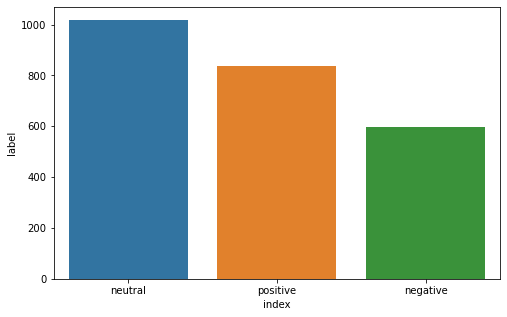

In [67]:
plt.figure(figsize=(8,5)) 
sns.barplot(x='index',y='label',data=counts_df)

In [63]:
data_agg=data[['user_name','date','label']]
display(data_agg.head(5))


,user_name,date,label
0,ᏉᎥ☻լꂅϮ,2020-07-25 12:27:21,positive
1,Tom Basile 🇺🇸,2020-07-25 12:27:17,positive
27,beatnikgeek the soothsayer,2020-07-25 12:26:26,neutral
29,🏎🚒🚨☎️⚖️☎️📩📥📧 TAX Reform,2020-07-25 12:26:21,neutral
33,Alan Taylor,2020-07-25 12:26:15,neutral


In [147]:
data_agg.columns=['date','label','counts']
display(data_agg.head())

,date,label,counts
0,ᏉᎥ☻լꂅϮ,2020-07-25 12:27:21,positive
1,Tom Basile 🇺🇸,2020-07-25 12:27:17,positive
27,beatnikgeek the soothsayer,2020-07-25 12:26:26,neutral
29,🏎🚒🚨☎️⚖️☎️📩📥📧 TAX Reform,2020-07-25 12:26:21,neutral
33,Alan Taylor,2020-07-25 12:26:15,neutral


In [64]:
data_agg.columns=['date','label','counts']
display(data_agg.head())

,date,label,counts
0,ᏉᎥ☻լꂅϮ,2020-07-25 12:27:21,positive
1,Tom Basile 🇺🇸,2020-07-25 12:27:17,positive
27,beatnikgeek the soothsayer,2020-07-25 12:26:26,neutral
29,🏎🚒🚨☎️⚖️☎️📩📥📧 TAX Reform,2020-07-25 12:26:21,neutral
33,Alan Taylor,2020-07-25 12:26:15,neutral
